Fire Detection Using  VGG16 Model


this notebook will create a new  model that help to detect the fire from an image

   the dataset is loaded from kuggle: https://www.kaggle.com/datasets/phylake1337/fire-dataset

   the model is trained using the VGG16 model from tenserflow

In [14]:
import os
import cv2
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import keras
from keras.callbacks import EarlyStopping
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
import json

In [6]:
os.environ["kuggle_config"]="/content/"

In [7]:
!kaggle datasets download -d phylake1337/fire-dataset

 95% 369M/387M [00:05<00:00, 67.9MB/s]
100% 387M/387M [00:05<00:00, 73.8MB/s]


In [ ]:
# prompt: unzip the data /content/fire-dataset.zip

!unzip /content/fire-dataset.zip


1- load the dataset and prepare it to be compatible with the VGG16

  splite the data into training data and validation data with ratio 0.2 and batch size is   32


In [9]:
pathdataset="/content/fire_dataset"

batch_size = 32
target_size = (224, 224)
validation_split = 0.2
train= tf.keras.preprocessing.image_dataset_from_directory(
    pathdataset,
    validation_split=validation_split,
    subset="training",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)
validation= tf.keras.preprocessing.image_dataset_from_directory(
    pathdataset,
    validation_split=validation_split,
    subset="validation",
    seed=44,
    image_size=target_size,
    batch_size=batch_size,
)


Found 999 files belonging to 2 classes.
Using 800 files for training.
Found 999 files belonging to 2 classes.
Using 199 files for validation.


the dataset contains two classes are fire_image and non_fire_image

In [10]:
train.class_names
class_names=train.class_names
class_names

['fire_images', 'non_fire_images']

we plot  a sample of the data set for visualize the image and the labels

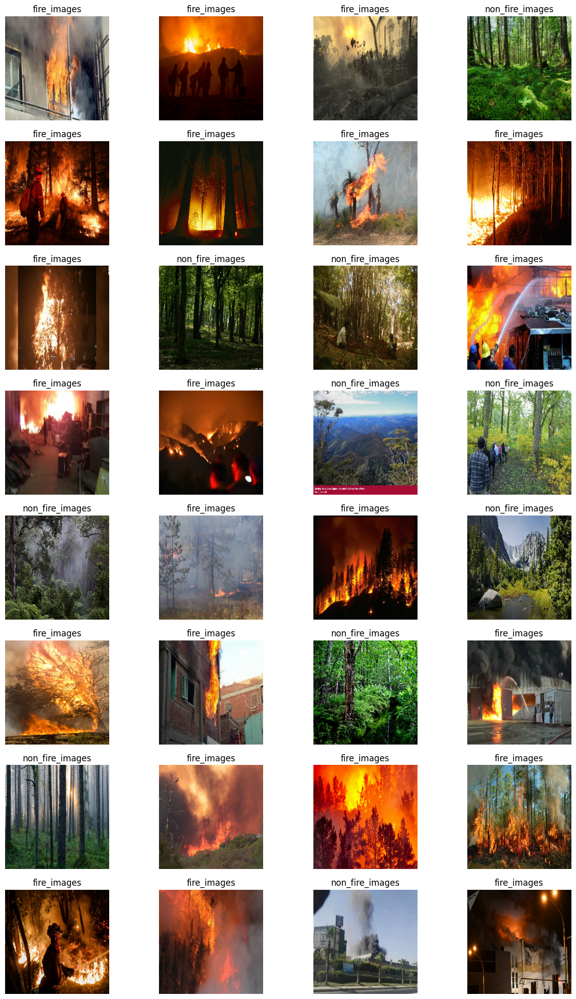

In [11]:
plt.figure(figsize=(15, 25))
for images, labels in train.take(1):
    for i in range(32):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

load the VGG16 from tenserflow with input shape 224 X 224 X 3  

create our  model  by add a layer fully connected with 5 neurons and  sigmoid activation


In [38]:
vgg16 = tf.keras.applications.VGG16(input_shape=(224,224,3),include_top=False,weights='imagenet')
vgg16.trainable = False
x = Flatten()(vgg16.output)

x = Dense(6, activation='sigmoid')(x)
output = Dense(2, activation='softmax')(x)
model = Model(inputs=vgg16.input, outputs=output)

model.summary()  # desplay the model summary

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

complie the model

In [39]:


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


training the model with the following parameters and we add a Early stopping callback to the model to reduce overfitting problems

In [40]:
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Entraîner le modèle
history = model.fit(train, validation_data=validation, epochs=16,callbacks=[early_stopping_callback])


Epoch 1/16
25/25 [==============================] - 17s 528ms/step - loss: 0.4560 - accuracy: 0.7387 - val_loss: 0.3885 - val_accuracy: 0.7688
Epoch 2/16
25/25 [==============================] - 16s 539ms/step - loss: 0.3973 - accuracy: 0.7500 - val_loss: 0.3530 - val_accuracy: 0.7688
Epoch 3/16
25/25 [==============================] - 18s 574ms/step - loss: 0.3682 - accuracy: 0.7525 - val_loss: 0.3309 - val_accuracy: 0.7688
Epoch 4/16
25/25 [==============================] - 16s 534ms/step - loss: 0.3489 - accuracy: 0.7538 - val_loss: 0.3102 - val_accuracy: 0.7688
Epoch 5/16
25/25 [==============================] - 16s 546ms/step - loss: 0.3211 - accuracy: 0.7538 - val_loss: 0.2905 - val_accuracy: 0.7688
Epoch 6/16
25/25 [==============================] - 16s 536ms/step - loss: 0.2997 - accuracy: 0.8338 - val_loss: 0.2674 - val_accuracy: 0.9548
Epoch 7/16
25/25 [==============================] - 16s 541ms/step - loss: 0.2693 - accuracy: 0.9450 - val_loss: 0.2167 - val_accuracy: 0.9749

 plot  the training and validation loss by epoch

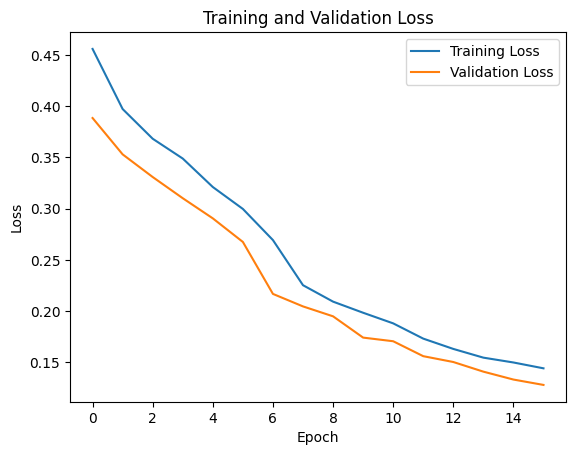

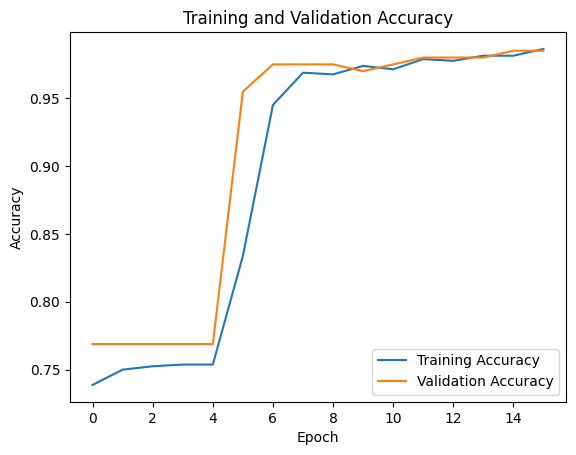

In [41]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

evualate the model in data validation

In [42]:

score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

7/7 [==============================] - 4s 127ms/step - loss: 0.1278 - accuracy: 0.9849
Test Loss = 0.12779633700847626
Test Accuracy = 0.9849246144294739


In [43]:


# Save the history to disk as a JSON file
with open('training_history_v2.json', 'w') as file:
    json.dump(history.history, file)

save the history of training  it may be using later

save the model

In [ ]:
# Load the saved history from disk
with open('training_history_v1.json', 'r') as file:
    loaded_history = json.load(file)


In [45]:
model.save('fire_detection_v1.keras')

predicte tha data validation and plote it

In [44]:
X,y=[],[]
for images, labels in validation:
    y.extend(labels.numpy())
    X.extend(images.numpy())
predictions=model.predict(np.array(X))
y_pred= np.argmax(predictions, axis=1)





7/7 [==============================] - 1s 143ms/step


In [ ]:
# Afficher les classes prédites pour chaque prédiction
print("Classes prédites :", y_pred)

Classes prédites : [0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 0 1 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 1]


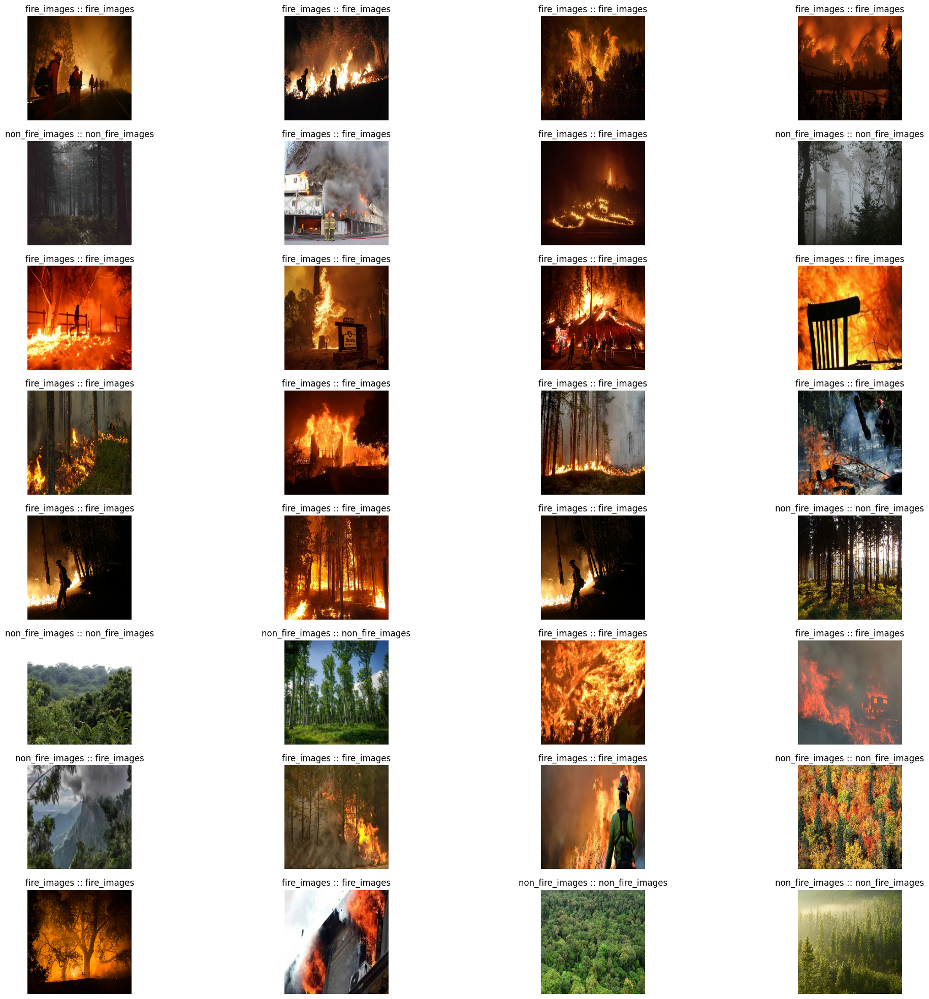

In [46]:
plt.figure(figsize=(25,25))
for i in range(32,64):
    ax = plt.subplot(8, 4, i + 1-32)
    plt.imshow(X[i].astype("uint8"))
    plt.title(f'{class_names[y[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

load the model from the disk and use it to predict for testing only

In [ ]:
loaded_model = tf.keras.models.load_model('fire_detection_v1.keras')

In [ ]:
X,y=[],[]
for images, labels in validation:
    y.extend(labels.numpy())
    X.extend(images.numpy())
predictions=loaded_model.predict(np.array(X))
y_pred= np.argmax(predictions, axis=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step


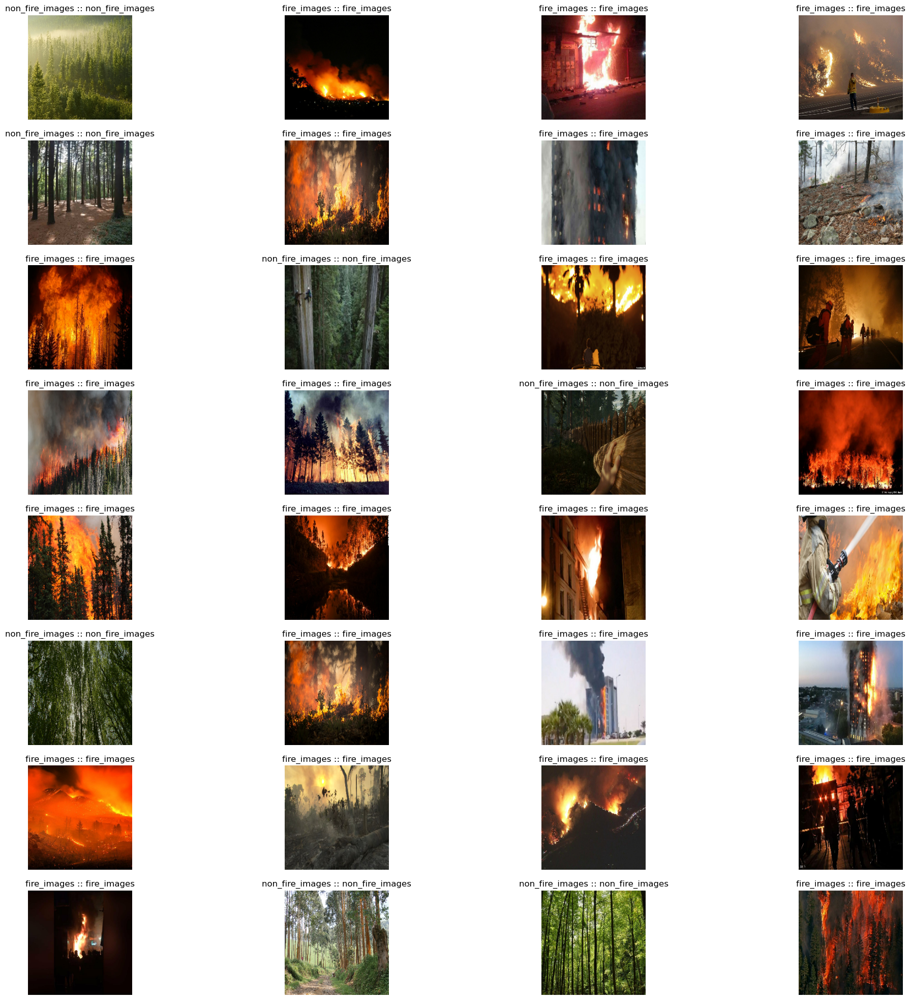

In [ ]:
plt.figure(figsize=(25,25))
for i in range(32,64):
    ax = plt.subplot(8, 4, i + 1-32)
    plt.imshow(X[i].astype("uint8"))
    plt.title(f'{class_names[y[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")